# Object Detection from Video

In this notebook, three different Convolutional Neural Network architecture based models are implemented to detect objects from video. Initially, they are implemented on images, then on videos to check their detection and with what confidence score it detects and how long it takes to detect objects.

Performing detections on two videos by three models, it is concluded that

- Out of MobileNet SSD, Faster R-CNN and YOLOv8, two models detects objects with better confidence scores. These are Faster R-CNN model and YOLOv8 model.
- Along with this, Faster R-CNN took a very longer time than rest two models to detect objects.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2

# Meta data of Videos
Extracting basic metadata such as frame rate, total number of frames, resolution, and duration

In [86]:
def get_video_metadata(video_path):
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        print("Error: Could not open video.")
        return
    
    fps = cap.get(cv2.CAP_PROP_FPS)
    frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    duration = frame_count / fps
    
    print(f"FPS: {fps}")
    print(f"Total Frames: {frame_count}")
    print(f"Resolution: {width}x{height}")
    print(f"Duration: {duration:.2f} seconds")
    
    cap.release()

print('For 1st Video: ')
get_video_metadata('/kaggle/input/road-traffic-video-monitoring/road_trafifc.mp4')

print('-'*20)

print('For 2nd Video: ')
get_video_metadata('/kaggle/input/traffic/Images/27260-362770008_tiny.mp4')

For 1st Video: 
FPS: 29.97002997002997
Total Frames: 301
Resolution: 640x360
Duration: 10.04 seconds
--------------------
For 2nd Video: 
FPS: 29.97002997002997
Total Frames: 335
Resolution: 640x360
Duration: 11.18 seconds


# Frame Extraction and Inspection
Extracting random frames from the video to inspect quality and content.

For 1st Video


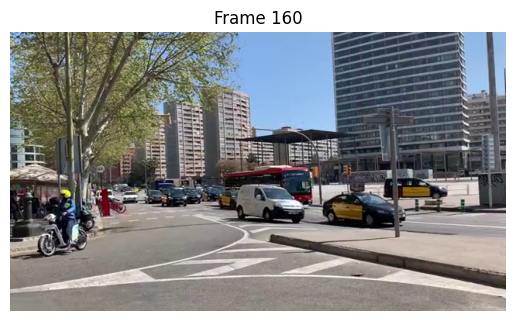

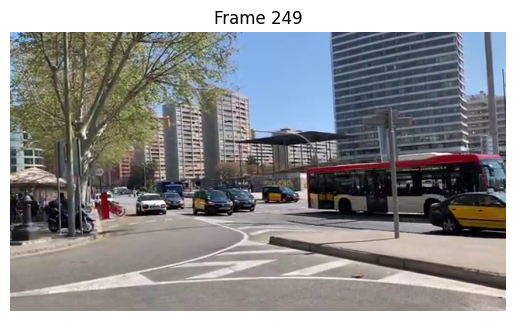

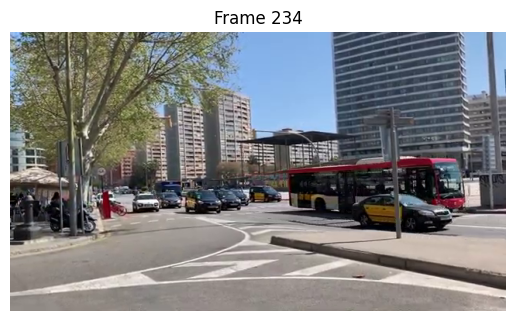

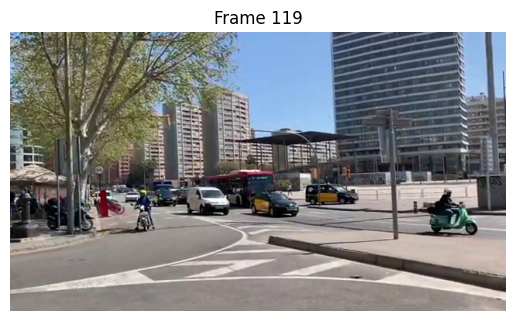

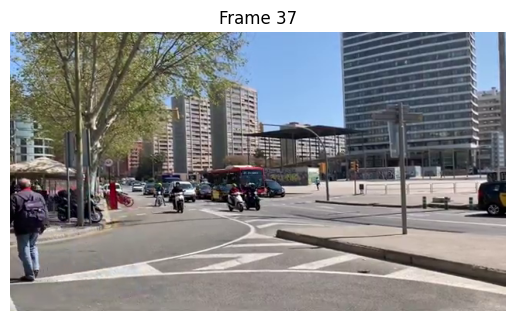

In [89]:
import random

def display_random_frames(video_path, num_frames=6):
    cap = cv2.VideoCapture(video_path)
    frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    frame_indices = random.sample(range(frame_count), num_frames)
    for idx in frame_indices:
        cap.set(cv2.CAP_PROP_POS_FRAMES, idx)
        ret, frame = cap.read()
        if ret:
            frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            plt.imshow(frame)
            plt.title(f"Frame {idx}")
            plt.axis('off')
            plt.show()
    
    cap.release()

print('For 1st Video')
display_random_frames('/kaggle/input/road-traffic-video-monitoring/road_trafifc.mp4', num_frames=5)

# Frame Quality Analysis: Brightness and Contrast Over Time

Analyzing the brightness and contrast levels of frames over time

For 1st Video: 


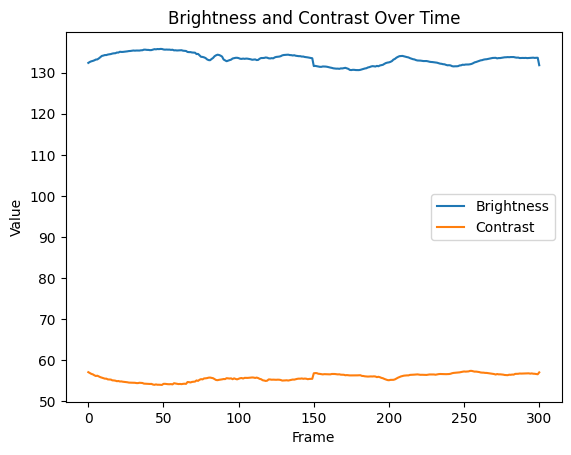

For 2nd Video: 


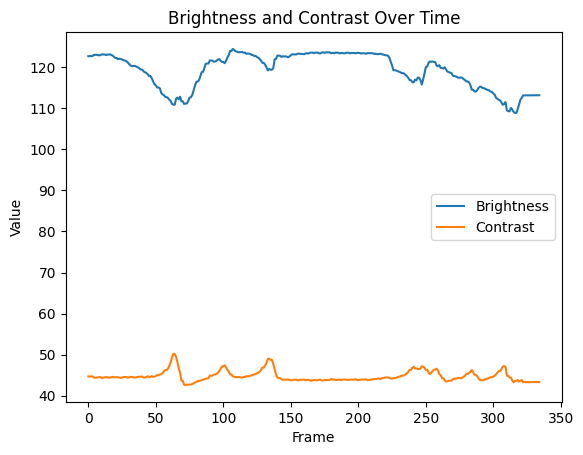

In [91]:
def compute_brightness(image):
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    return np.mean(hsv[:,:,2])

def analyze_brightness_contrast(video_path):
    cap = cv2.VideoCapture(video_path)
    brightness_levels = []
    contrast_levels = []

    frame_idx = 0
    while True:
        ret, frame = cap.read()
        if not ret:
            break
        
        brightness = compute_brightness(frame)
        contrast = frame.std()
        brightness_levels.append(brightness)
        contrast_levels.append(contrast)
        
        frame_idx += 1
    
    cap.release()
    
    plt.figure()
    plt.plot(brightness_levels, label='Brightness')
    plt.plot(contrast_levels, label='Contrast')
    plt.legend()
    plt.title('Brightness and Contrast Over Time')
    plt.xlabel('Frame')
    plt.ylabel('Value')
    plt.show()

print('For 1st Video: ')
analyze_brightness_contrast('/kaggle/input/road-traffic-video-monitoring/road_trafifc.mp4')

print('For 2nd Video: ')
analyze_brightness_contrast('/kaggle/input/traffic/Images/27260-362770008_tiny.mp4')

# MobileNet SSD (Single Shot MultiBox Detector) - Convolutional Neural Networks (CNNs) based
____

It is a deep neural network architecture for object detection. It is designed for mobile and embedded vision applications. MobileNet SSD combines the MobileNet architecture for feature extraction with a detection head based on the Single Shot Multibox Detector (SSD) framework.

### Algorithms used in the MobileNet SSD model include:
- **Convolutional Neural Networks (CNNs):** These are used for feature extraction. MobileNet employs depthwise separable convolutions to reduce the number of parameters and computations.
- **Single Shot Multibox Detector (SSD):** This algorithm is used for object detection. It predicts bounding boxes and class probabilities directly from feature maps at multiple scales.

In [2]:
!wget -O 'MobileNetSSD_deploy.caffemodel' https://github.com/TheNsBhasin/DNN_Object_Detection/blob/master/MobileNetSSD_deploy.caffemodel?raw=true

--2024-06-03 21:48:14--  https://github.com/TheNsBhasin/DNN_Object_Detection/blob/master/MobileNetSSD_deploy.caffemodel?raw=true
Resolving github.com (github.com)... 140.82.116.3
Connecting to github.com (github.com)|140.82.116.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://github.com/TheNsBhasin/DNN_Object_Detection/raw/master/MobileNetSSD_deploy.caffemodel [following]
--2024-06-03 21:48:14--  https://github.com/TheNsBhasin/DNN_Object_Detection/raw/master/MobileNetSSD_deploy.caffemodel
Reusing existing connection to github.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/TheNsBhasin/DNN_Object_Detection/master/MobileNetSSD_deploy.caffemodel [following]
--2024-06-03 21:48:15--  https://raw.githubusercontent.com/TheNsBhasin/DNN_Object_Detection/master/MobileNetSSD_deploy.caffemodel
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110

In [3]:
!wget -O 'MobileNetSSD_deploy.prototxt' https://raw.githubusercontent.com/TheNsBhasin/DNN_Object_Detection/master/MobileNetSSD_deploy.prototxt.txt

--2024-06-03 21:48:19--  https://raw.githubusercontent.com/TheNsBhasin/DNN_Object_Detection/master/MobileNetSSD_deploy.prototxt.txt
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 29353 (29K) [text/plain]
Saving to: 'MobileNetSSD_deploy.prototxt'

MobileNetSSD_deploy 100%[===================>]  28.67K  --.-KB/s    in 0.001s  

2024-06-03 21:48:20 (20.2 MB/s) - 'MobileNetSSD_deploy.prototxt' saved [29353/29353]



In [4]:
!pip install imutils

  Preparing metadata (setup.py) ... done
  Created wheel for imutils: filename=imutils-0.5.4-py3-none-any.whl size=25834 sha256=f26ff4b802237cf49c04f3c585ac8980d006c0360b2e456412df09fd61c4e8c3
  Stored in directory: /root/.cache/pip/wheels/85/cf/3a/e265e975a1e7c7e54eb3692d6aa4e2e7d6a3945d29da46f2d7
Successfully built imutils


### Performing on Image

In [5]:
image = cv2.imread('/kaggle/input/traffic/Images/traffic-7033509_640.jpg')

# model files
prototxt = 'MobileNetSSD_deploy.prototxt'
model = 'MobileNetSSD_deploy.caffemodel'

# load model
net = cv2.dnn.readNetFromCaffe(prototxt, model)

# class labels of model
# these are provided by model

classLabels = { 0: 'Background', 1: 'Aeroplane', 2: 'Cycle', 3: 'Bird', 4: 'Boat', 5: 'Bottle', 
              6: 'Bus', 7: 'Car', 8: 'Cat', 9: 'Chair', 10: 'Cow', 
              11: 'Diningtable', 12: 'Dog', 13: 'Horse', 14: 'Motorbike', 15: 'Person', 
              16: 'Plant', 17: 'Cattle', 18: 'Sofa', 19: 'Train', 20: 'TV Monitor'}


input_shape=(300,300) # input shape to pass through model
mean = (127.5,127.5,127.5) # mean
scale = 0.007843 # scaling parameter

# preprocessing and passing parameters defined
blob = cv2.dnn.blobFromImage(image, scalefactor=scale, size=input_shape, mean=mean, swapRB=True)
# swapRB -> OpenCV reads image in BGR format, and this model accepts in RGB format

net.setInput(blob)

(-0.5, 639.5, 426.5, -0.5)

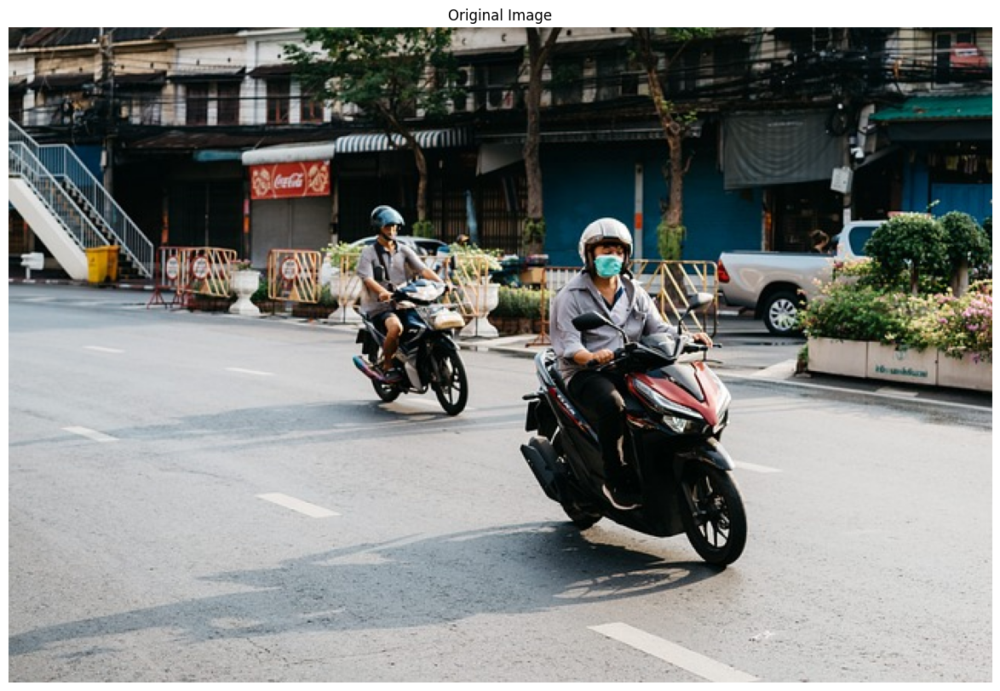

In [6]:
plt.figure(figsize=(20, 10))
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

# About results obtained

results.shape = (1, 1, 100, 7)
- Each prediction -> 7 float values
- 1st index - Class ID
- 2nd index - confidence score
- 3-6 index - coordinates

In [7]:
# prediction
results = net.forward()
print(results.shape)
print('Results: ', results)

(1, 1, 100, 7)
Results:  [[[[ 0.         14.          0.998896    0.51557624  0.3928615
     0.75218725  0.8203876 ]
   [ 0.         14.          0.90665543  0.3441003   0.40207306
     0.4750538   0.59784865]
   [ 0.         15.          0.82357466  0.33834112  0.28133947
     0.4432205   0.5429963 ]
   [ 0.         15.          0.4923069   0.5422659   0.3062297
     0.69770086  0.65725327]
   [ 0.          7.          0.4480974   0.6729362   0.3189654
     0.85516703  0.47209784]
   [ 0.         16.          0.4189252   0.81292146  0.28757343
     0.99252385  0.50498444]
   [ 0.          0.          0.          0.          0.
     0.          0.        ]
   [ 0.          0.          0.          0.          0.
     0.          0.        ]
   [ 0.          0.          0.          0.          0.
     0.          0.        ]
   [ 0.          0.          0.          0.          0.
     0.          0.        ]
   [ 0.          0.          0.          0.          0.
     0.          0.     

In [15]:
for i in range(results.shape[2]):
    confidence = round(results[0, 0, i, 2], 2) # i - represents predictions and 2 represents confidence score
    if confidence > 0.4:
        id = int(results[0, 0, i, 1])  # here 1 for class ID
        # 3-6 -> coordinates
        x1, y1, x2, y2 = results[0, 0, i, 3:7]  

        ih, iw, ic = image.shape
        x1, x2 = int(x1*iw), int(x2*iw)
        y1, y2 = int(y1 * ih), int(y2 * ih)
        c = round(confidence*100, 2)
        cv2.rectangle(image, (x1, y1), (x2, y2), (255, 0, 0), 2)
        cv2.putText(image, f'{classLabels[id]}:{c}', (x1, y1-10),  cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

### Implementation on Images

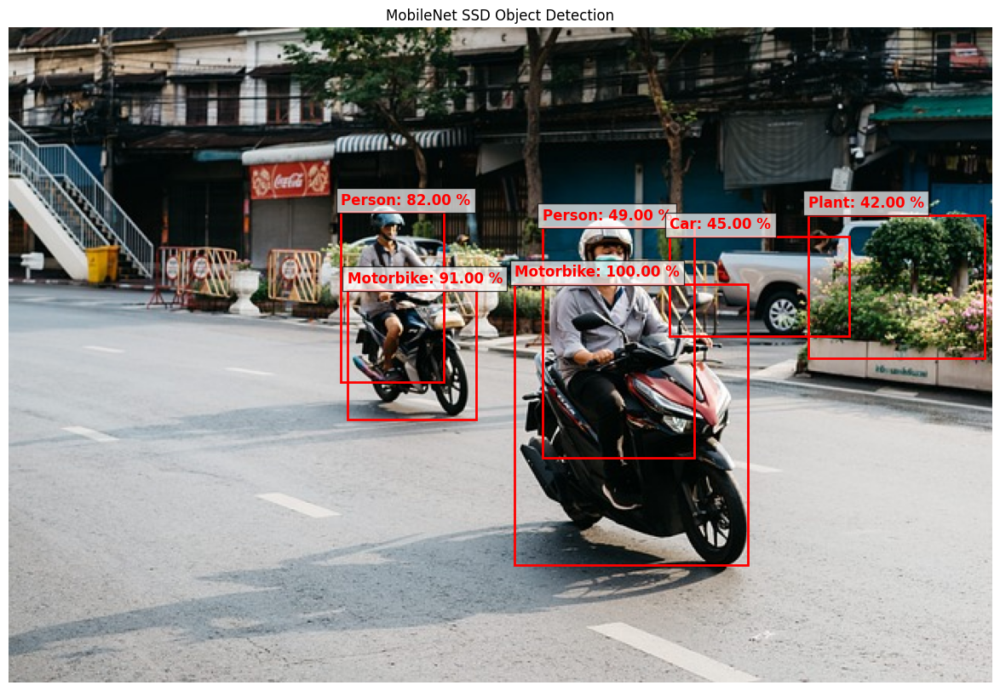

In [8]:
import matplotlib.patches as patches

image = cv2.imread("/kaggle/input/traffic/Images/traffic-7033509_640.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# figure and axis
fig, ax = plt.subplots(1, figsize=(20, 10))

# Display the image
ax.imshow(image)

ih, iw, ic = image.shape

# Process detections
for i in range(results.shape[2]):
    confidence = round(results[0, 0, i, 2], 2)  # Confidence score
    if confidence > 0.4:
        id = int(results[0, 0, i, 1])  # Class ID
        x1, y1, x2, y2 = results[0, 0, i, 3:7]  # Coordinates
        
        # Scale coordinates to image dimensions
        x1, x2 = int(x1 * iw), int(x2 * iw)
        y1, y2 = int(y1 * ih), int(y2 * ih)
        
        # Drawing bounding box
        width, height = x2 - x1, y2 - y1
        edgecolor = 'red'
        ax.add_patch(patches.Rectangle((x1, y1), width, height, edgecolor=edgecolor, facecolor='none', linewidth=2))
        
        # Adding label
        label = f"{classLabels[id]}: {confidence*100:.2f} %"
        ax.text(x1, y1 - 5, label, color=edgecolor, fontsize=12, weight='bold', bbox=dict(facecolor='white', alpha=0.7))

# Show the plot
plt.axis('off')
plt.title('MobileNet SSD Object Detection')
#plt.savefig("detected_image.jpg", bbox_inches='tight', pad_inches=0)
plt.show()

In [11]:
import matplotlib.patches as patches

def mobileNetSSD_image(input_path):

    image = cv2.imread(input_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) 
    
    blob = cv2.dnn.blobFromImage(image, scalefactor=scale, size=input_shape, mean=mean, swapRB=True)
    net.setInput(blob)
    results = net.forward()
    
    # figure and axes
    fig, ax = plt.subplots(1, figsize=(20, 10))

    ax.imshow(image)

    ih, iw, ic = image.shape

    # detection process
    for i in range(results.shape[2]):
        confidence = round(results[0, 0, i, 2], 2)  # Confidence score
        if confidence > 0.4:
            id = int(results[0, 0, i, 1])  # Class ID
            x1, y1, x2, y2 = results[0, 0, i, 3:7]  # Coordinates

            # Scale coordinates -> image dimensions
            x1, x2 = int(x1 * iw), int(x2 * iw)
            y1, y2 = int(y1 * ih), int(y2 * ih)

            # bounding box
            width, height = x2 - x1, y2 - y1
            edgecolor = 'red'
            ax.add_patch(patches.Rectangle((x1, y1), width, height, edgecolor=edgecolor, facecolor='none', linewidth=2))

            # label
            label = f"{classLabels[id]}: {confidence*100:.2f} %"
            ax.text(x1, y1 - 5, label, color=edgecolor, fontsize=12, weight='bold', bbox=dict(facecolor='white', alpha=0.7))

    plt.axis('off')
    plt.title('MobileNet SSD Object Detection')
    #plt.savefig("detected_image.jpg", bbox_inches='tight', pad_inches=0)
    plt.show()

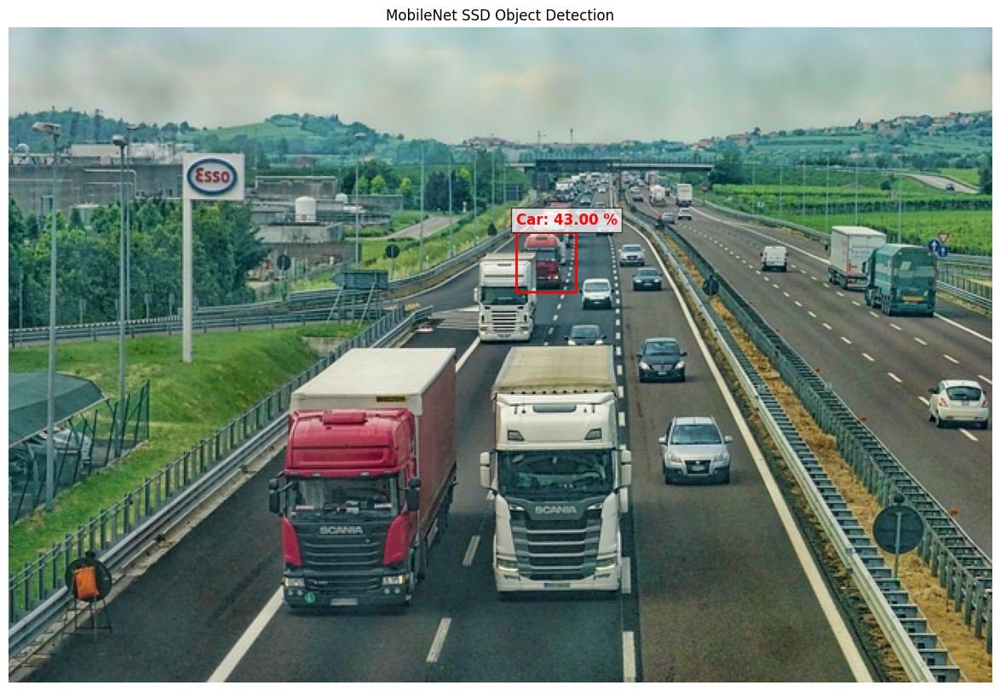

In [12]:
mobileNetSSD_image('/kaggle/input/traffic/Images/highway-3392100_640.jpg')

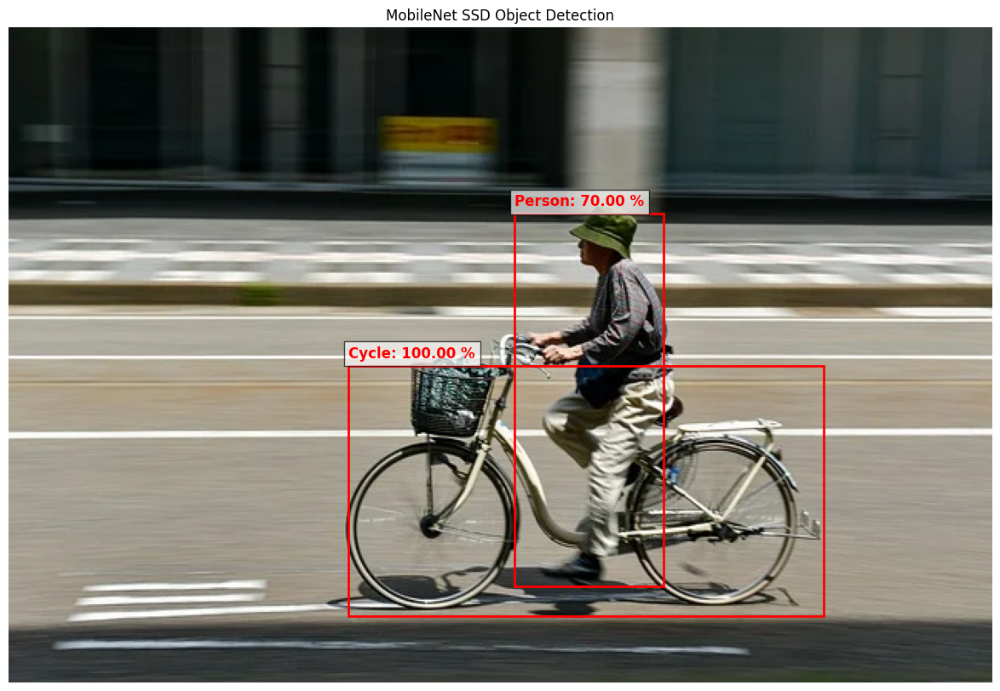

In [13]:
mobileNetSSD_image('/kaggle/input/traffic/Images/road-8046167_640.webp')

# Implementation on Video

In [14]:
def mobileNetSSD_video(input_video_path, output_video_path):

    cap = cv2.VideoCapture(input_video_path)
    fps = cap.get(cv2.CAP_PROP_FPS)
    frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

    images = [] # for storing each frames where objects are being detected, further it will be converted to video

    while True:
        ret, frame = cap.read()
        if not ret:
            break

        image = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        blob = cv2.dnn.blobFromImage(image, scalefactor=scale, size=input_shape, mean=mean, swapRB=True)
        net.setInput(blob)
        results = net.forward()

        # Visualizing the detections on the frame (extracted from video)
        ih, iw, ic = frame.shape
        fig, ax = plt.subplots()
        ax.imshow(frame)

        for i in range(results.shape[2]):
            confidence = round(results[0, 0, i, 2], 2)  # Confidence score
            if confidence > 0.4:
                id = int(results[0, 0, i, 1])  # Class ID
                x1, y1, x2, y2 = results[0, 0, i, 3:7]  # Coordinates

                # Scale coordinates -> image dimensions
                x1, x2 = int(x1 * iw), int(x2 * iw)
                y1, y2 = int(y1 * ih), int(y2 * ih)

                # Bounding box
                width, height = x2 - x1, y2 - y1
                edgecolor = 'red'
                ax.add_patch(patches.Rectangle((x1, y1), width, height, edgecolor=edgecolor, facecolor='none', linewidth=2))

                # Adding label and confidnce scores
                label = f"{classLabels[id]}: {confidence*100:.2f} %"
                ax.text(x1, y1 - 5, label, color=edgecolor, fontsize=12, weight='bold', bbox=dict(facecolor='white', alpha=0.7))

        # Saving the annotated frames as image
        plt.axis('off')
        plt.savefig("annotated_image.jpg", bbox_inches='tight', pad_inches=0, dpi=100)
        annotated_frame = cv2.imread('/kaggle/working/annotated_image.jpg')
        images.append(annotated_frame) # appending annotated frames in images list
        plt.close()

    # Release resource
    cap.release()


    def create_video_from_frames(frames, video_path, fps): # creating frames from images list

      # Getting frame dimensions from the first frame
      frame_height, frame_width = frames[0].shape[:2]

      # Defining video writer codec and fourcc code
      fourcc = cv2.VideoWriter_fourcc(*'mp4v')
      
      out = cv2.VideoWriter(video_path, fourcc, fps, (frame_width, frame_height))

      # Writing each frame to the video
      for frame in frames:
        out.write(frame)

      # Release video writer resource
      out.release()

    create_video_from_frames(images, output_video_path, fps) # calling function
    print("Video created successfully!")

In [15]:
input_video_path = '/kaggle/input/road-traffic-video-monitoring/road_trafifc.mp4'
output_video_path = 'mobileNet_SSD_output_video1.mp4'

mobileNetSSD_video(input_video_path, output_video_path)

Video created successfully!


In [16]:
input_video_path = '/kaggle/input/traffic/Images/27260-362770008_tiny.mp4'
output_video_path = 'mobileNet_SSD_output_video2.mp4'

mobileNetSSD_video(input_video_path, output_video_path)

Video created successfully!


# Faster R-CNN: Convolutional Neural Network based

The model used is a Faster R-CNN (Region-based Convolutional Neural Network) architecture which uses a ResNet-50 backbone pretrained on the COCO dataset.

- **Faster R-CNN:** Faster R-CNN is a two-stage object detection model. It consists of a Region Proposal Network followed by a Region-based Convolutional Neural Network (RCNN). It proposes regions in the image that are likely to contain objects, and then classifies these regions and refines their bounding boxes.

- **ResNet-50:** ResNet is a type of convolutional neural network architecture.

- **Pretrained on COCO:** It has been trained on a COCO Dataset having huge amount of labeled images.

In [21]:
!pip install torch
!pip install torchvision
!pip3 install Cython

In [52]:
import torchvision
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True) # downloading pretrained ResNet Faster RCNN model
model.eval()

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [53]:
# There are N/A’s in the label list, as few classes are removed

coco_labels = ['__background__', 'person', 
                                'bicycle', 'car', 'motorcycle', 
                                'airplane', 'bus', 'train', 'truck', 
                                'boat', 'traffic light', 'fire hydrant', 
                                'N/A', 'stop sign', 'parking meter', 'bench', 
                                'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 
                                'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 
                                'backpack', 'umbrella', 'N/A', 'N/A', 'handbag', 
                                'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 
                                'sports ball', 'kite', 'baseball bat', 'baseball glove', 
                                'skateboard', 'surfboard', 'tennis racket', 'bottle', 'N/A', 
                                'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 
                                'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 
                                'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch', 
                                'potted plant', 'bed', 'N/A', 'dining table', 'N/A', 'N/A', 
                                'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 
                                'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 
                                'N/A', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush']

## Performing on Image

In [58]:
from PIL import Image
import torchvision.transforms as T

def get_prediction(img_path, threshold):
    img = Image.open(img_path)
    transform = T.Compose([T.ToTensor()])
    img = transform(img)
    pred = model([img])
    pred_class = [coco_labels[i] for i in list(pred[0]['labels'].numpy())]
    pred_boxes = [[(i[0], i[1]), (i[2], i[3])] for i in list(pred[0]['boxes'].detach().numpy())]
    pred_score = list(pred[0]['scores'].detach().numpy())
    pred_t = [pred_score.index(x) for x in pred_score if x>threshold][-1]
    pred_boxes = pred_boxes[:pred_t+1]
    pred_class = pred_class[:pred_t+1]
    pred_confidences = pred_score[:pred_t+1]  # Extracting confidence scores
    return pred_boxes, pred_class, pred_confidences  # returning confidence scores with boxes and classes

def frcnn_object_detection(img_path):
    boxes, pred_cls, confidences = get_prediction(img_path, 0.7) 
    
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    fig, ax = plt.subplots(figsize=(20, 10))
    ax.imshow(img)
    
    for i in range(len(boxes)):
        box = boxes[i]
        x1, y1 = box[0]
        x2, y2 = box[1]
        width = x2 - x1
        height = y2 - y1
        
        # Drawing bounding box
        rect = patches.Rectangle((x1, y1), width, height, linewidth=2, edgecolor='green', facecolor='none')
        ax.add_patch(rect)
        
        # Add label
        label = f"{pred_cls[i]}: {confidences[i]*100:.2f}"
        ax.text(x1, y1 - 5, label, color='green', fontsize=12, weight='bold', bbox=dict(facecolor='white', alpha=0.7))
    
    plt.axis('off')
    plt.title('Faster R-CNN Object Detection')
    plt.show()

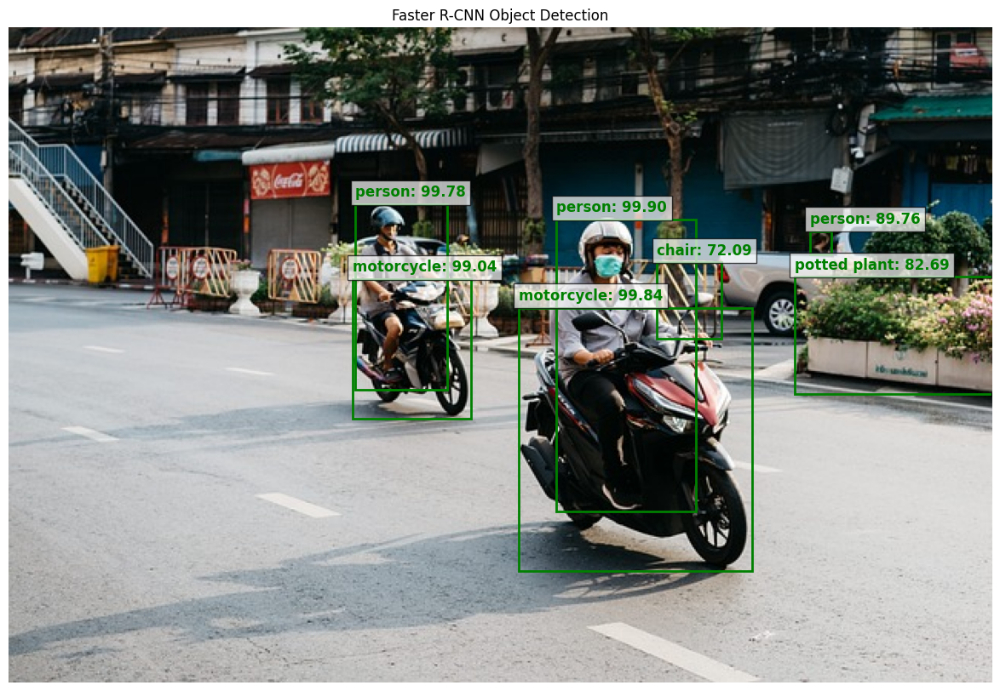

In [32]:
frcnn_object_detection('/kaggle/input/traffic/Images/traffic-7033509_640.jpg')

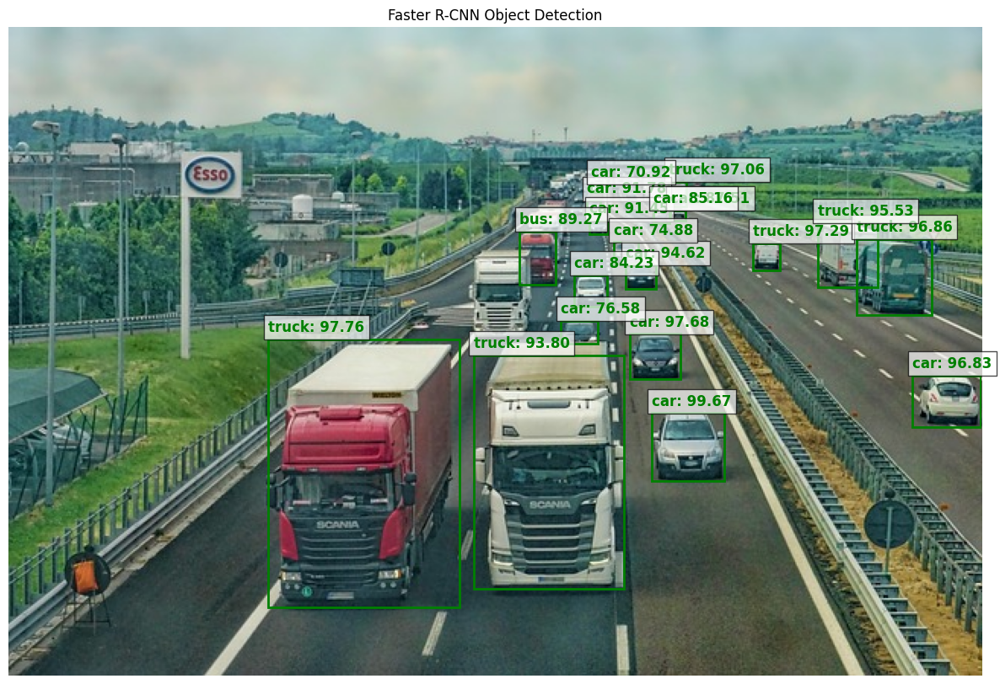

In [33]:
frcnn_object_detection('/kaggle/input/traffic/Images/highway-3392100_640.jpg')

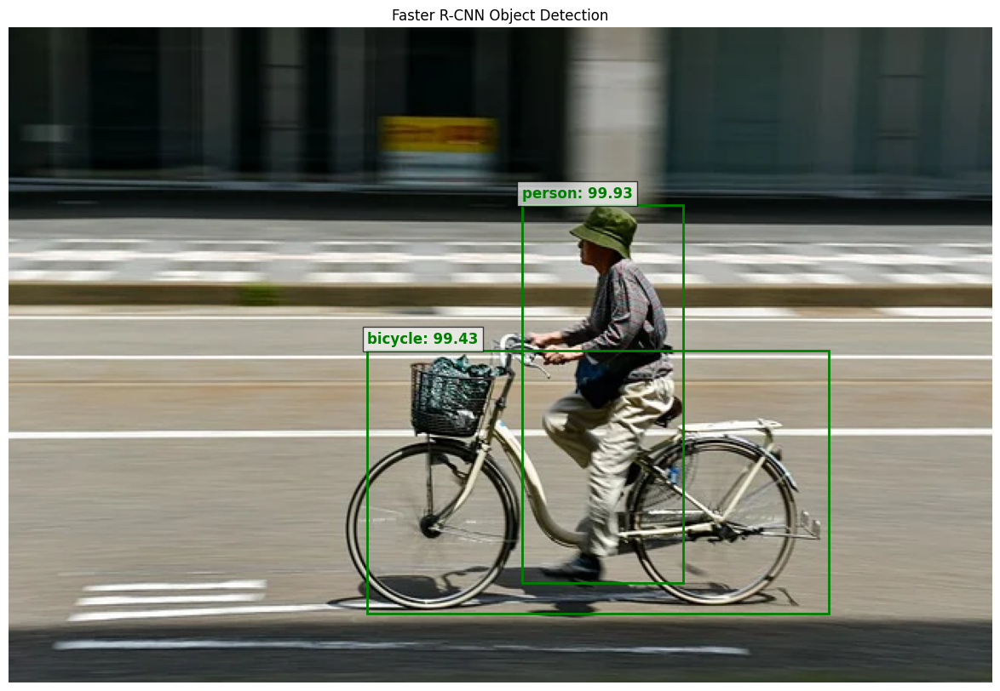

In [34]:
frcnn_object_detection('/kaggle/input/traffic/Images/road-8046167_640.webp')

# Performing on Video

In [59]:
def video_detect(input_video_path):
    
    images = []
    cap = cv2.VideoCapture(input_video_path)
    fps = cap.get(cv2.CAP_PROP_FPS)
    frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    
    print('Total frames: ', int(cap.get(cv2.CAP_PROP_FRAME_COUNT)))
    
    frame_cnt = 0
    while True:
        
        if frame_cnt == int(cap.get(cv2.CAP_PROP_FRAME_COUNT)):
            break
        
        frame_cnt += 1
        
        ret, frame = cap.read()
        if not ret:
            break
        
        cv2.imwrite('temp_img.jpg', frame)
        img_path = '/kaggle/working/temp_img.jpg'
        boxes, pred_cls, confidences = get_prediction(img_path, 0.7) 
    
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        fig, ax = plt.subplots()
        ax.imshow(img)

        for i in range(len(boxes)):
            box = boxes[i]
            x1, y1 = box[0]
            x2, y2 = box[1]
            width = x2 - x1
            height = y2 - y1

            # Drawing bounding box
            rect = patches.Rectangle((x1, y1), width, height, linewidth=2, edgecolor='green', facecolor='none')
            ax.add_patch(rect)

            # Add label
            label = f"{pred_cls[i]}: {confidences[i]*100:.2f}"
            ax.text(x1, y1 - 5, label, color='green', fontsize=12, weight='bold', bbox=dict(facecolor='white', alpha=0.7))

        # Saving the annotated frame
        plt.axis('off')
        plt.savefig("annotated_image.jpg", bbox_inches='tight', pad_inches=0, dpi=100)
        annotated_frame = cv2.imread('/kaggle/working/annotated_image.jpg')
        images.append(annotated_frame)
        plt.close()

    cap.release()
    
    return images

In [60]:
def frcnn_video(input_video_path, output_video_path):
    images = video_detect(input_video_path)

    cap = cv2.VideoCapture(input_video_path)
    fps = cap.get(cv2.CAP_PROP_FPS)
    frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

    def create_video_from_frames(frames, video_path, fps):

        # Getting frame dimensions from the first frame
        frame_height, frame_width = frames[0].shape[:2]

        # video writer codec and fourcc code
        fourcc = cv2.VideoWriter_fourcc(*'mp4v')

        # video writer object
        out = cv2.VideoWriter(video_path, fourcc, fps, (frame_width, frame_height))

        # each frame to the video
        for frame in frames:
            out.write(frame)

        # Release video writer resource
        out.release()

    create_video_from_frames(images, output_video_path, fps)
    print("Video created successfully!")

In [61]:
input_video_path = '/kaggle/input/road-traffic-video-monitoring/road_trafifc.mp4'
output_video_path = 'frcnn_output_video1.mp4'

frcnn_video(input_video_path, output_video_path)

Total frames:  301
Video created successfully!


In [62]:
input_video_path = '/kaggle/input/traffic/Images/27260-362770008_tiny.mp4'
output_video_path = 'frcnn_output_video2.mp4'

frcnn_video(input_video_path, output_video_path)

Total frames:  335
Video created successfully!


# YOLO: Convolutional Neural Network based

Here we are using the YOLOv8 model, which is an object detection model known for its speed and accuracy. YOLO models are based on convolutional neural networks (CNNs) and employ a single neural network to predict bounding boxes and class probabilities directly from full images in a single evaluation.

Steps implemented:

- Load the pre-trained YOLOv8 model.
- Running object detection on an image.
- Extract bounding box coordinates, confidence scores, and class IDs.
- Drawing bounding boxes and labelling on the image.

In [64]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.2/41.2 kB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 779.6/779.6 kB 15.3 MB/s eta 0:00:0000:01


### Performing on Images

In [65]:
from ultralytics import YOLO

# Importing and Loading the Model
model = YOLO("yolov8m.pt")
results = model.predict("/kaggle/input/traffic/Images/traffic-7033509_640.jpg") # Running Inference

print('-'*20)
print('Result:', results) # results contains the detection results for the image

100%|██████████| 49.7M/49.7M [00:00<00:00, 191MB/s]



image 1/1 /kaggle/input/traffic/Images/traffic-7033509_640.jpg: 448x640 3 persons, 1 car, 2 motorcycles, 638.5ms
Speed: 3.0ms preprocess, 638.5ms inference, 4.2ms postprocess per image at shape (1, 3, 448, 640)
--------------------
Result: [ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: None
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 

In [66]:
result = results[0] # accessing the results for the first image.

In [67]:
len(result.boxes) # number of detected objects in the image

6

In [68]:
box = result.boxes[0] # selecting the first detected object from the list of detected objects.
box

ultralytics.engine.results.Boxes object with attributes:

cls: tensor([0.])
conf: tensor([0.8853])
data: tensor([[351.4163, 123.7291, 457.1440, 311.9706,   0.8853,   0.0000]])
id: None
is_track: False
orig_shape: (427, 640)
shape: torch.Size([1, 6])
xywh: tensor([[404.2802, 217.8499, 105.7277, 188.2415]])
xywhn: tensor([[0.6317, 0.5102, 0.1652, 0.4408]])
xyxy: tensor([[351.4163, 123.7291, 457.1440, 311.9706]])
xyxyn: tensor([[0.5491, 0.2898, 0.7143, 0.7306]])

In [69]:
print("Class ID of the detected object:", box.cls)
print("Coordinates of the bounding box in the format (x_min, y_min, x_max, y_max):", box.xyxy)
print("Confidence score of the detection", box.conf)

Class ID of the detected object: tensor([0.])
Coordinates of the bounding box in the format (x_min, y_min, x_max, y_max): tensor([[351.4163, 123.7291, 457.1440, 311.9706]])
Confidence score of the detection tensor([0.8853])


In [70]:
cords = box.xyxy[0].tolist()
cords = [round(x) for x in cords]
class_id = result.names[box.cls[0].item()]
conf = round(box.conf[0].item(), 2)

print("Class ID and its Label:", class_id)
print("Coordinates:", cords)
print("Confidence Score:", conf)

Class ID and its Label: person
Coordinates: [351, 124, 457, 312]
Confidence Score: 0.89


In [72]:
# checking all detected objects, their coordinates and confidence score

for box in result.boxes:
    
    class_id = result.names[box.cls[0].item()]
    cords = box.xyxy[0].tolist()
    cords = [round(x) for x in cords]
    conf = round(box.conf[0].item(), 2)
    
    print("Class Label:", class_id)
    print("Coordinates:", cords)
    print("Confidence Score:", conf)
    print()

Class Label: person
Coordinates: [351, 124, 457, 312]
Confidence Score: 0.89

Class Label: person
Coordinates: [226, 116, 285, 229]
Confidence Score: 0.86

Class Label: motorcycle
Coordinates: [332, 160, 481, 352]
Confidence Score: 0.86

Class Label: motorcycle
Coordinates: [223, 154, 301, 254]
Confidence Score: 0.84

Class Label: person
Coordinates: [522, 133, 538, 148]
Confidence Score: 0.46

Class Label: car
Coordinates: [460, 126, 572, 200]
Confidence Score: 0.39



In [73]:
import matplotlib.patches as patches
from ultralytics import YOLO

model = YOLO("yolov8m.pt") # model

def yolo_image(input_path):
    # Predict on the image
    results = model.predict(input_path)

    # Extract boxes and labels
    boxes = results[0].boxes.xyxy.cpu().numpy()  # Bounding boxes
    scores = results[0].boxes.conf.cpu().numpy()  # Confidence scores
    class_ids = results[0].boxes.cls.cpu().numpy().astype(int)  # Class IDs
    class_names = results[0].names  # Class names

    image = cv2.imread(results[0].path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Figure and axis
    fig, ax = plt.subplots(1, figsize=(20, 10))

    ax.imshow(image)

    # Adding bounding boxes
    for box, score, class_id in zip(boxes, scores, class_ids):
        xmin, ymin, xmax, ymax = box
        width, height = xmax - xmin, ymax - ymin
        edgecolor = 'blue'
        ax.add_patch(patches.Rectangle((xmin, ymin), width, height, edgecolor=edgecolor, facecolor='none', linewidth=2))
        label = f"{class_names[class_id]}: {score:.2f}"
        ax.text(xmin, ymin - 5, label, color=edgecolor, fontsize=12, weight='bold', bbox=dict(facecolor='white', alpha=0.7))

    plt.axis('off')
    plt.title('YOLOv8 Object Detection')
    plt.show()


image 1/1 /kaggle/input/traffic/Images/traffic-7033509_640.jpg: 448x640 3 persons, 1 car, 2 motorcycles, 593.8ms
Speed: 2.1ms preprocess, 593.8ms inference, 1.1ms postprocess per image at shape (1, 3, 448, 640)


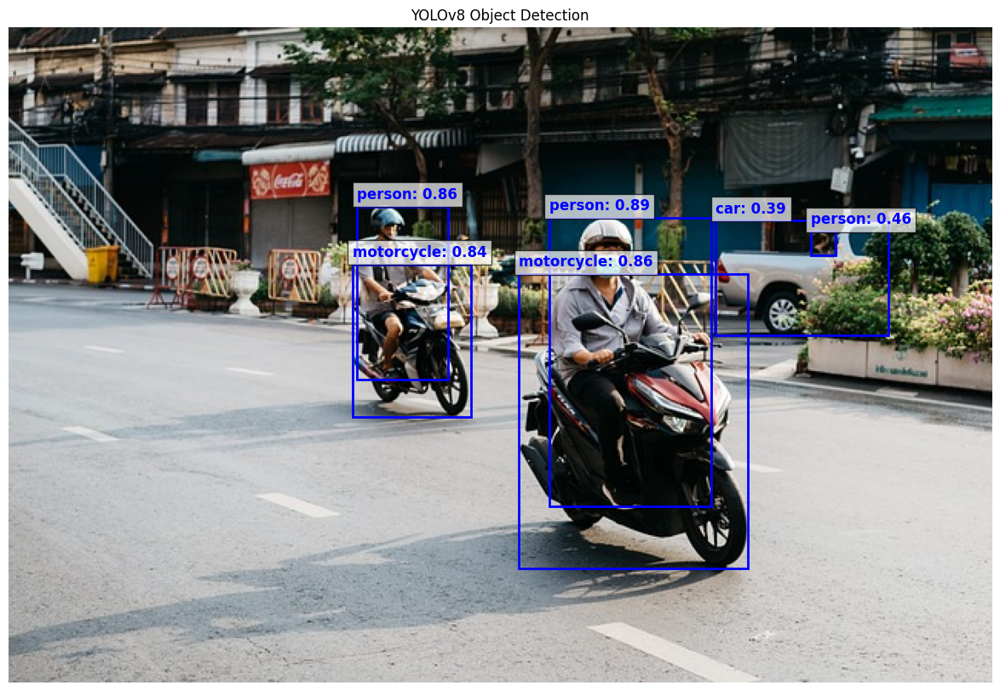

In [74]:
yolo_image('/kaggle/input/traffic/Images/traffic-7033509_640.jpg')


image 1/1 /kaggle/input/traffic/Images/highway-3392100_640.jpg: 448x640 8 cars, 2 buss, 6 trucks, 616.7ms
Speed: 1.9ms preprocess, 616.7ms inference, 1.1ms postprocess per image at shape (1, 3, 448, 640)


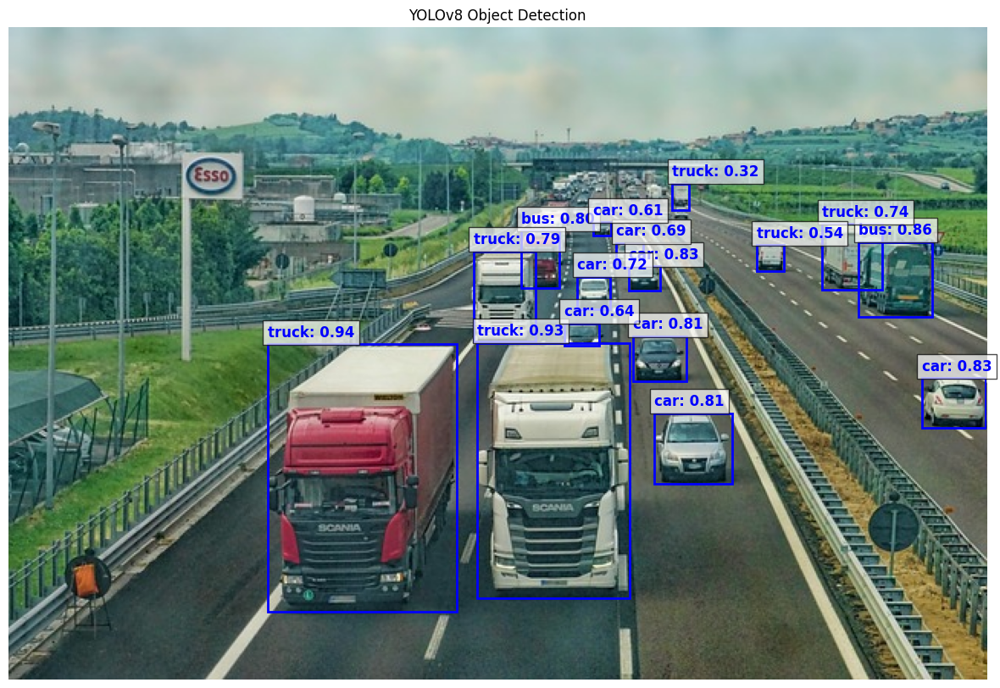

In [75]:
yolo_image('/kaggle/input/traffic/Images/highway-3392100_640.jpg')


image 1/1 /kaggle/input/traffic/Images/road-8046167_640.webp: 448x640 1 person, 1 bicycle, 1 handbag, 622.4ms
Speed: 2.9ms preprocess, 622.4ms inference, 1.1ms postprocess per image at shape (1, 3, 448, 640)


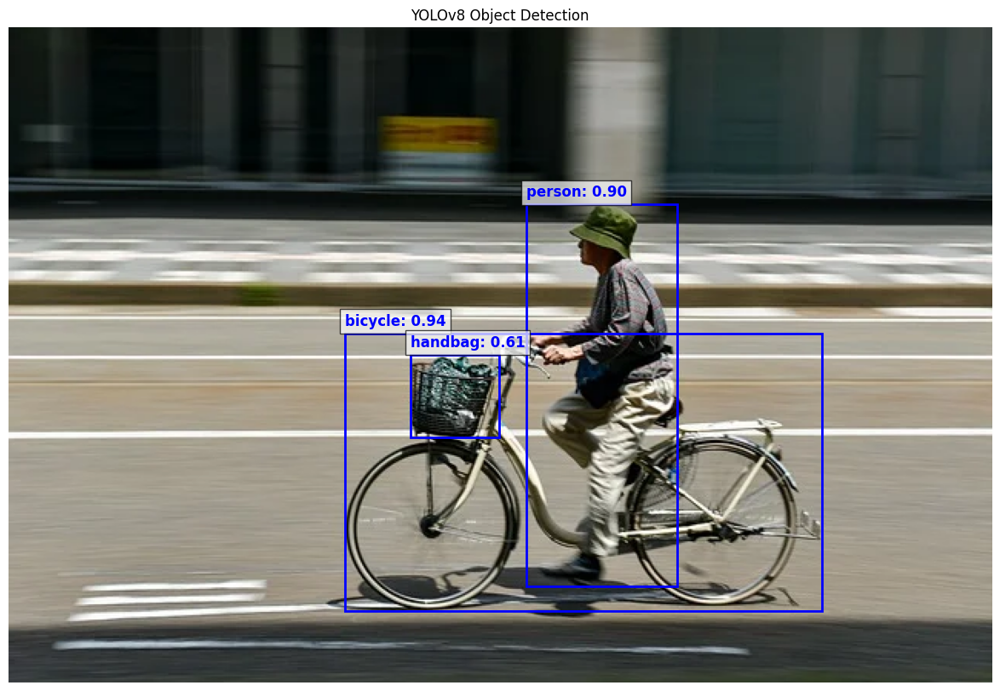

In [76]:
yolo_image('/kaggle/input/traffic/Images/road-8046167_640.webp')

### Performing on Video

In [78]:
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from ultralytics import YOLO

def yolo_video(input_video_path, output_video_path):

    cap = cv2.VideoCapture(input_video_path)
    fps = cap.get(cv2.CAP_PROP_FPS)
    frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

    images = []  # List to store annotated frames

    while True:
        ret, frame = cap.read()
        if not ret:
            break

        # Saving the frame as temp_img.jpg
        cv2.imwrite("temp_img.jpg", frame)

        results = model.predict("temp_img.jpg")

        # Extract boxes and labels
        boxes = results[0].boxes.xyxy.cpu().numpy()  # Bounding boxes
        scores = results[0].boxes.conf.cpu().numpy()  # Confidence scores
        class_ids = results[0].boxes.cls.cpu().numpy().astype(int)  # Class IDs
        class_names = results[0].names  # Class names

        frame = cv2.imread("temp_img.jpg")
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

        fig, ax = plt.subplots()
        ax.imshow(frame)

        for box, score, class_id in zip(boxes, scores, class_ids):
            if score > 0.7:  # Filter for confidence > 70%
                xmin, ymin, xmax, ymax = box
                width, height = xmax - xmin, ymax - ymin
                edgecolor = 'blue'
                ax.add_patch(patches.Rectangle((xmin, ymin), width, height, edgecolor=edgecolor, facecolor='none', linewidth=2))
                label = f"{class_names[class_id]}: {score:.2f}"
                ax.text(xmin, ymin - 5, label, color=edgecolor, fontsize=12, weight='bold', bbox=dict(facecolor='white', alpha=0.7))

        # Save the annotated frame
        plt.axis('off')
        plt.savefig("annotated_image.jpg", bbox_inches='tight', pad_inches=0, dpi=100)
        annotated_frame = cv2.imread("annotated_image.jpg")
        images.append(annotated_frame)  # Append annotated frames to the images list
        plt.close()

    cap.release()

    def create_video_from_frames(frames, video_path, fps):
        # frame dimensions from the first frame
        frame_height, frame_width = frames[0].shape[:2]

        # video writer codec and fourcc code
        fourcc = cv2.VideoWriter_fourcc(*'mp4v')
        out = cv2.VideoWriter(video_path, fourcc, fps, (frame_width, frame_height))

        # each frame to the video
        for frame in frames:
            out.write(frame)

        # Release video writer resource
        out.release()

    create_video_from_frames(images, output_video_path, fps)  # Calling the function to create the video
    print("Video created successfully!")

In [79]:
input_video_path = '/kaggle/input/road-traffic-video-monitoring/road_trafifc.mp4'
output_video_path = 'yolo_output_video.mp4'
yolo_video(input_video_path, output_video_path)


image 1/1 /kaggle/working/temp_img.jpg: 384x640 4 persons, 4 cars, 3 motorcycles, 1 bus, 2 traffic lights, 1 bench, 1 backpack, 574.4ms
Speed: 1.8ms preprocess, 574.4ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/temp_img.jpg: 384x640 4 persons, 4 cars, 3 motorcycles, 1 bus, 2 traffic lights, 1 bench, 1 backpack, 593.3ms
Speed: 1.5ms preprocess, 593.3ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/temp_img.jpg: 384x640 6 persons, 6 cars, 2 motorcycles, 1 bus, 3 traffic lights, 1 bench, 1 backpack, 566.9ms
Speed: 1.7ms preprocess, 566.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/temp_img.jpg: 384x640 7 persons, 1 bicycle, 4 cars, 3 motorcycles, 1 bus, 2 traffic lights, 1 bench, 1 backpack, 545.0ms
Speed: 1.7ms preprocess, 545.0ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/temp_img.jpg: 384x640 

In [80]:
input_video_path = '/kaggle/input/traffic/Images/27260-362770008_tiny.mp4'
output_video_path = 'yolo_output_video2.mp4'

yolo_video(input_video_path, output_video_path)


image 1/1 /kaggle/working/temp_img.jpg: 384x640 8 cars, 505.6ms
Speed: 1.7ms preprocess, 505.6ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/temp_img.jpg: 384x640 9 cars, 494.8ms
Speed: 1.5ms preprocess, 494.8ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/temp_img.jpg: 384x640 8 cars, 488.4ms
Speed: 2.0ms preprocess, 488.4ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/temp_img.jpg: 384x640 8 cars, 477.4ms
Speed: 1.5ms preprocess, 477.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/temp_img.jpg: 384x640 8 cars, 524.1ms
Speed: 1.3ms preprocess, 524.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/temp_img.jpg: 384x640 8 cars, 480.1ms
Speed: 1.4ms preprocess, 480.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/wor